In [16]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy import io
import scvelo as scv

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


In [2]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Mathys_2019')

fig_dir = 'figures/'
data_dir = 'data/'


In [59]:
adata_processed = sc.read_h5ad("/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Mathys_2019/data/Mathys_2019_processed.h5ad")


## load the mathys dataset

In [3]:
# test loading the whole dataset

count_data_dir  = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/AD_Mathys_2019/'
samples = [s for s in os.listdir(count_data_dir)]
adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Mathys_2019'
    adata.obs['orig_barcode'] = adata.obs.index

    adata_list.append(adata)

    print(sample, adata.layers['spliced'].shape)


D17-8758 (1623, 36601)
D17-8759 (2023, 36601)
D17-8756 (2470, 36601)
D17-8757 (2937, 36601)
D17-8765 (1861, 36601)
D17-8764 (1120, 36601)
D17-8783 (947, 36601)
D17-8782 (728, 36601)
D17-8755 (1218, 36601)
D17-8789 (869, 36601)
D17-8788 (1132, 36601)
D17-8776 (1870, 36601)
D17-8781 (1855, 36601)
D17-8777 (1873, 36601)
D17-8780 (2183, 36601)
D17-8754 (325, 36601)
D17-8787 (1792, 36601)
D17-8786 (1003, 36601)
D17-8753 (506, 36601)
D17-8767 (3478, 36601)
D17-8763 (1580, 36601)
D17-8762 (3400, 36601)
D17-8766 (1524, 36601)
D17-8779 (2550, 36601)
D17-8778 (2339, 36601)
D17-8775 (754, 36601)
D17-8774 (1868, 36601)
D17-8769 (1236, 36601)
D17-8768 (1682, 36601)
D17-8771 (1555, 36601)
D17-8770 (1940, 36601)
D17-8773 (1797, 36601)
D17-8772 (1238, 36601)
D17-8784 (2325, 36601)
D17-8785 (1179, 36601)
D17-8790 (2216, 36601)
D17-8791 (843, 36601)
D17-8760 (3952, 36601)
D17-8761 (1595, 36601)
D17-8792 (1996, 36601)
D17-8793 (1989, 36601)
D17-8794 (1578, 36601)
D17-8795 (2130, 36601)
D17-8796 (1500, 36

In [4]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

adata.obs['corrected_barcode'] = adata.obs.orig_barcode.astype(str) + '-' + adata.obs.batch.astype(str)

# drop "batch" column:
adata.obs = adata.obs.drop('batch', axis=1)

# print shape of dataset
adata.shape


(79919, 36601)

In [5]:
# load the sample metadata table 
sample_meta = pd.read_csv('{}/mathys_meta.csv'.format(data_dir))
sample_meta = sample_meta.rename({'specimenID': 'Sample'}, axis=1)


# merge with anndata obs
temp = adata.obs.merge(sample_meta, how='left', on='Sample')
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

In [6]:
# load the rosmap meta tables:
rosmap_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/AD_Zhou_2020/ROSMAP_clinical.csv',
    sep = ','
)

In [7]:
sample_meta.head()

,sampleID,Sample,sex,diagnosis,brain region,assay,assay chemistry
0,ROS13,D17-8753,male,Other,dorsolateral prefrontal cortex,snRNA-seq,10xv2
1,ROS45,D17-8754,male,Alzheimer Disease,dorsolateral prefrontal cortex,snRNA-seq,10xv2
2,ROS14,D17-8755,male,Control,dorsolateral prefrontal cortex,snRNA-seq,10xv2
3,ROS38,D17-8756,male,Other,dorsolateral prefrontal cortex,snRNA-seq,10xv2
4,ROS1,D17-8757,female,Control,dorsolateral prefrontal cortex,snRNA-seq,10xv2


In [8]:
# metadata from the actual publication supplementary
mathys_metadata = pd.read_csv('/dfs3b/swaruplab/smorabit/analysis/AD_NucSeq_2019/batch_correction/liger/update/joint_analysis/data/metaData.Tsai.merged_Final.csv')
mathys_metadata['barcode'] = [x.split('-')[0] for x in mathys_metadata.TAG.to_list()]

    

In [9]:
# find the sample ID by getting max overlaps between their barcodes and ours
match_list = []
for cur_sample in mathys_metadata.individualID.unique():
    print(cur_sample)
    cur_geo_df = mathys_metadata[mathys_metadata.individualID == cur_sample]
    
    pct_overlap = []
    for cur_sample in adata.obs.Sample.unique():
        cur_df = adata.obs[adata.obs.Sample == cur_sample]

        pct_overlap.append(sum(cur_geo_df.barcode.isin(cur_df.orig_barcode)) / cur_geo_df.shape[0])

    max_ind = pct_overlap.index(max(pct_overlap))
    sample_match = adata.obs.Sample.unique()[max_ind]
    match_list.append(sample_match)
    
    print(max(pct_overlap))
    print(sample_match)
    print()

R8744945
0.9896694214876033
D17-8753

R9426782
0.8720538720538721
D17-8754

R9307768
0.9931565440547476
D17-8755

R8608442
1.0
D17-8756

R2880377
0.9759697905938894
D17-8757

R7944883
0.9548346055979644
D17-8758

R4439627
0.945124938755512
D17-8759

R4146432
1.0
D17-8760

R4739508
1.0
D17-8761

R9094222
0.9978969505783386
D17-8762

R8725848
1.0
D17-8763

R3177264
1.0
D17-8764

R7721691
0.9977285633162976
D17-8765

R2895885
0.9932885906040269
D17-8766

R4689636
0.9928656361474435
D17-8767

R6114572
1.0
D17-8768

R4567280
0.9536585365853658
D17-8769

R8629052
0.9967126890203813
D17-8770

R4728676
0.9787917737789203
D17-8771

R4379962
0.9774977497749775
D17-8772

R7288382
0.9902801600914809
D17-8773

R2830542
1.0
D17-8774

R4482444
0.9771812080536912
D17-8775

R7770387
1.0
D17-8776

R9113571
0.9993476842791911
D17-8777

R4042599
0.9793769197016235
D17-8778

R1067972
1.0
D17-8779

R1538032
0.9909429941395844
D17-8780

R5816648
0.9859550561797753
D17-8781

R3086211
0.9901823281907434
D17-87

In [10]:
# make dataframe mapping between sample & match
match_df = pd.DataFrame()
match_df['geo_sample'] = mathys_metadata.individualID.unique()
match_df['match'] = match_list
match_df


# merge with anndata:
adata.obs['geo_sample'] = adata.obs.merge(
    match_df, how='left',
    left_on = "Sample", right_on = 'match'
)['geo_sample'].tolist()

In [11]:
# make dataframe mapping between sample & match
match_df = pd.DataFrame()
match_df['geo_sample'] = mathys_metadata.individualID.unique()
match_df['match'] = match_list
match_df


# merge with anndata:
adata_processed.obs['geo_sample'] = adata_processed.obs.merge(
    match_df, how='left',
    left_on = "Sample", right_on = 'match'
)['geo_sample'].tolist()

NameError: name 'adata_processed' is not defined

In [ ]:
temp = adata_processed.obs.merge(
    rosmap_meta[[c for c in rosmap_meta.columns if c not in adata_processed.obs.columns]],
    how='left', 
    left_on = 'geo_sample',
    right_on = 'individualID'
)

temp.index = temp.barcode
adata_processed.obs = temp
adata_processed.obs.index.name = None

In [12]:
temp = adata.obs.merge(
    rosmap_meta[[c for c in rosmap_meta.columns if c not in adata.obs.columns]],
    how='left', 
    left_on = 'geo_sample',
    right_on = 'individualID'
)

temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None

In [ ]:
adata_processed.obs

In [13]:
adata.obs.sex.value_counts()

female    41553
male      38366
Name: sex, dtype: int64

In [14]:
# save unfiltered dataset:
adata.write_h5ad('{}Mathys_2019_unfiltered.h5ad'.format(data_dir))


/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'orig_barcode' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'doublets' as categorical
/dfs3b/swaruplab/smorabit/bin/software/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The 

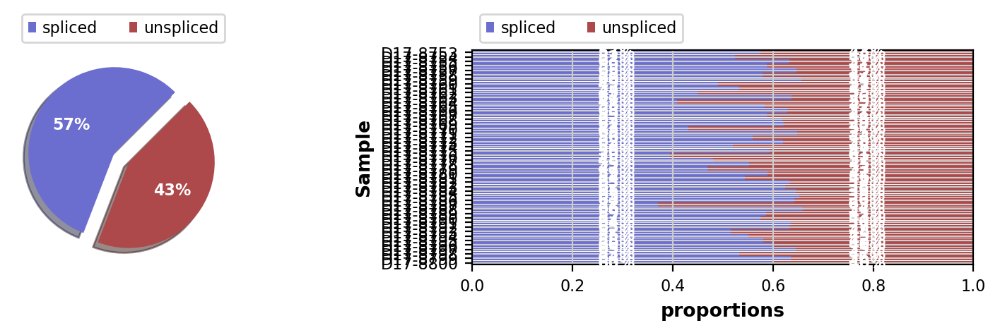

In [17]:
scv.pl.proportions(adata, groupby='Sample')

## Filter cells based on UMI, % MT reads, doublet scores, etc

In [18]:
adata = sc.read_h5ad('{}Mathys_2019_unfiltered.h5ad'.format(data_dir))


In [19]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

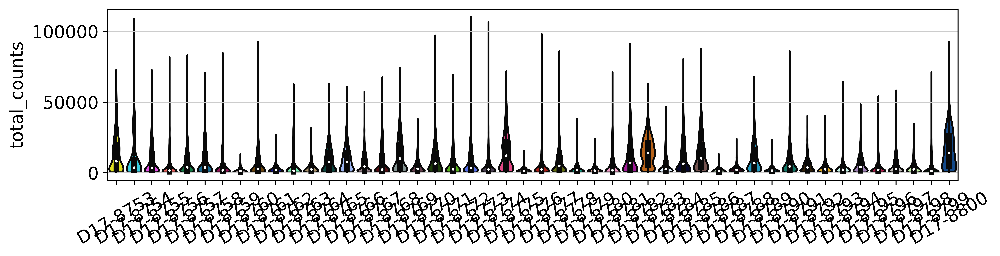

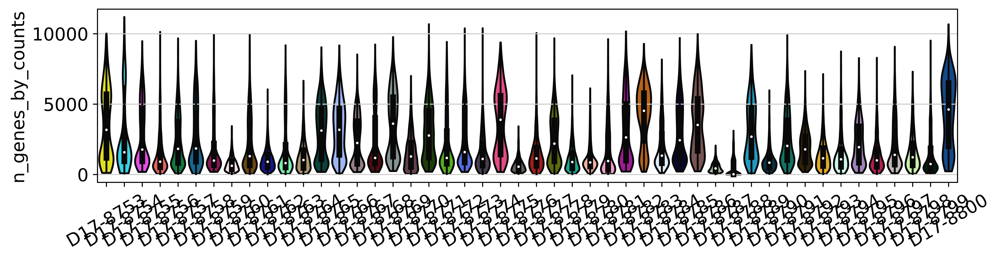

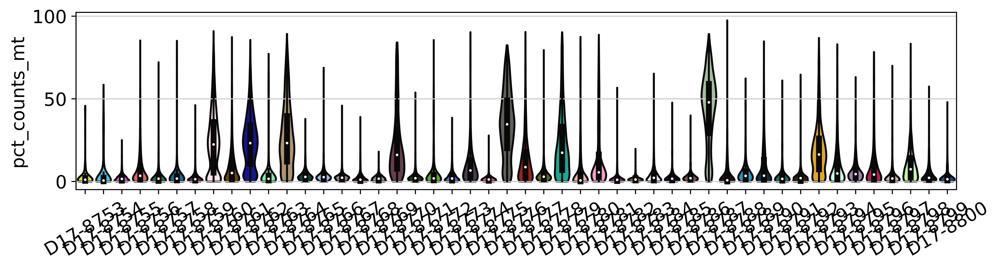

In [20]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [21]:

mt_quantile = 0.95
umi_quantile = 0.95
doublet_quantile = 0.95

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

D17-8760 removed  514 , kept  3142
D17-8767 removed  494 , kept  2965
D17-8762 removed  472 , kept  2685
D17-8757 removed  435 , kept  2496
D17-8779 removed  425 , kept  2013
D17-8756 removed  359 , kept  1979
D17-8784 removed  376 , kept  1946
D17-8778 removed  324 , kept  1995
D17-8790 removed  320 , kept  1803
D17-8780 removed  318 , kept  1797
D17-8795 removed  345 , kept  1741
D17-8759 removed  314 , kept  1689
D17-8792 removed  279 , kept  1711
D17-8793 removed  306 , kept  1627
D17-8799 removed  297 , kept  1615
D17-8765 removed  299 , kept  1555
D17-8770 removed  271 , kept  1583
D17-8773 removed  270 , kept  1524
D17-8797 removed  296 , kept  1482
D17-8774 removed  286 , kept  1473
D17-8777 removed  292 , kept  1453
D17-8776 removed  264 , kept  1478
D17-8798 removed  268 , kept  1457
D17-8768 removed  265 , kept  1411
D17-8781 removed  275 , kept  1401
D17-8758 removed  260 , kept  1339
D17-8761 removed  236 , kept  1322
D17-8771 removed  223 , kept  1331
D17-8787 removed  24

In [22]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata.shape

(67656, 36601)

In [23]:
adata = adata[adata.obs.n_genes_by_counts >= 250]
adata = adata[adata.obs.pct_counts_mt <= 10]

adata.shape

(50596, 36601)

## process data:

In [24]:
# preserve the counts in its own layer
adata.layers['counts'] = adata.X

In [25]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [26]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)


In [27]:
sc.tl.pca(adata, svd_solver='arpack')

In [28]:
sc.external.pp.harmony_integrate(adata, key = 'Sample')

2022-03-07 10:13:24,947 - harmonypy - INFO - Iteration 1 of 10
2022-03-07 10:13:49,060 - harmonypy - INFO - Iteration 2 of 10
2022-03-07 10:14:13,511 - harmonypy - INFO - Iteration 3 of 10
2022-03-07 10:14:37,333 - harmonypy - INFO - Iteration 4 of 10
2022-03-07 10:15:23,575 - harmonypy - INFO - Iteration 5 of 10
2022-03-07 10:15:49,324 - harmonypy - INFO - Iteration 6 of 10
2022-03-07 10:16:11,561 - harmonypy - INFO - Iteration 7 of 10
2022-03-07 10:16:23,265 - harmonypy - INFO - Iteration 8 of 10
2022-03-07 10:16:46,609 - harmonypy - INFO - Iteration 9 of 10
2022-03-07 10:16:59,604 - harmonypy - INFO - Iteration 10 of 10
2022-03-07 10:17:12,580 - harmonypy - INFO - Stopped before convergence


In [29]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [30]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [31]:
sc.tl.leiden(adata, resolution=1)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

In [32]:
# how many cells in each cluster?
adata.obs.leiden.value_counts()

0     10325
1      5618
2      4657
3      3337
4      2596
5      2496
6      2381
7      2235
8      2127
9      1990
10     1653
11     1585
12     1531
13     1279
14     1246
15     1173
16     1118
17      841
18      749
19      698
20      342
21      308
22      162
23      149
Name: leiden, dtype: int64

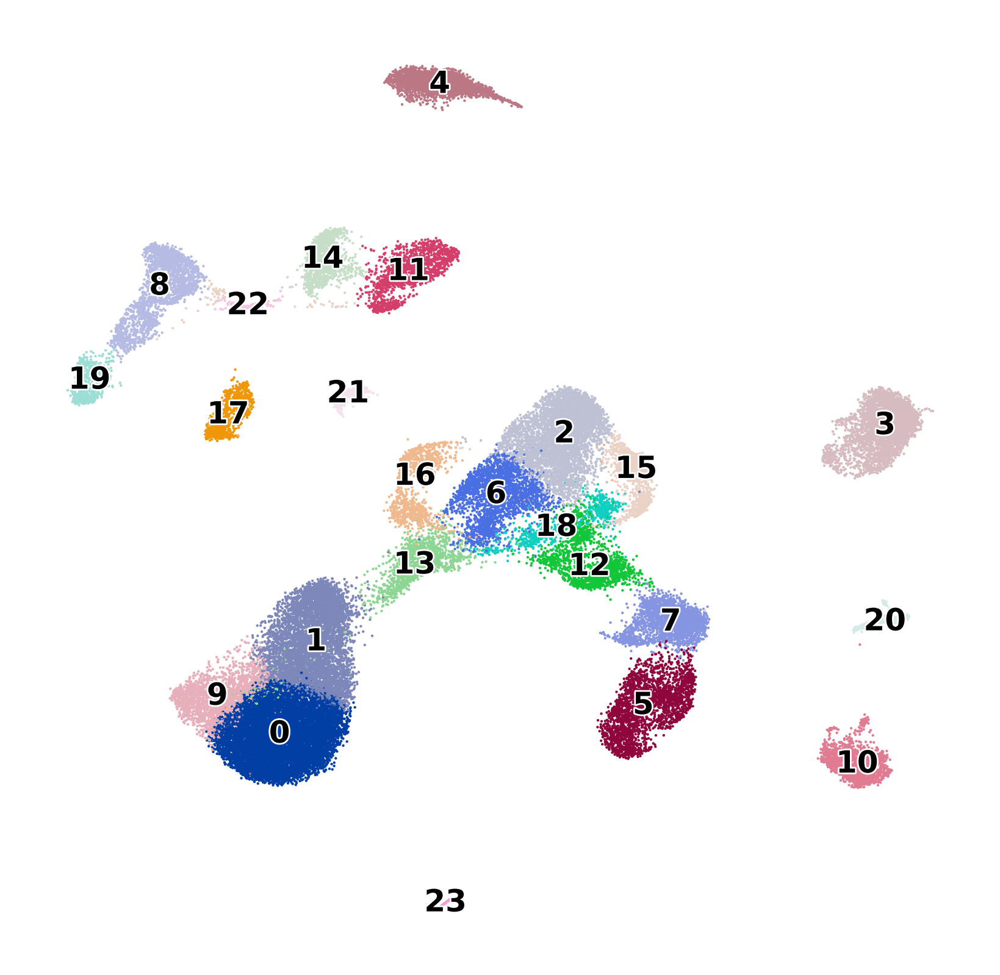

In [33]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


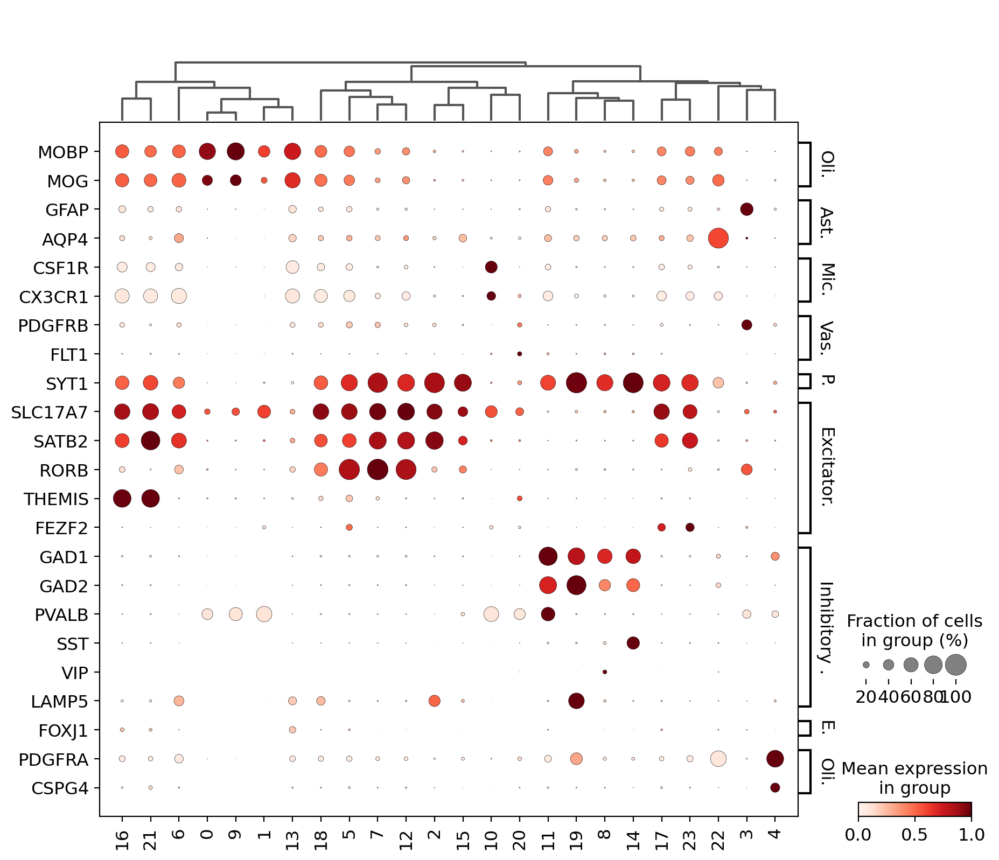

In [34]:
marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1',],
    'Vasculature': ['PDGFRB', 'FLT1'],
    'Pan-neuronal': ['SYT1'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True
)


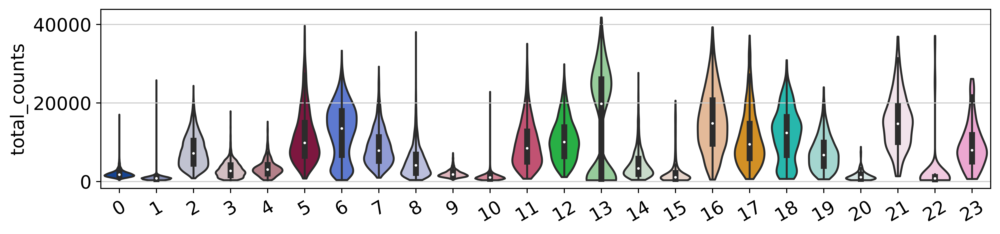

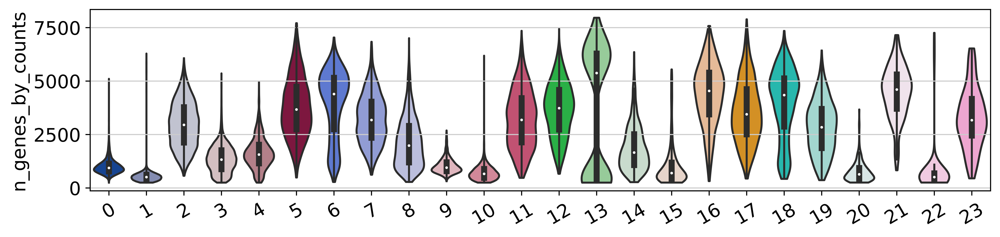

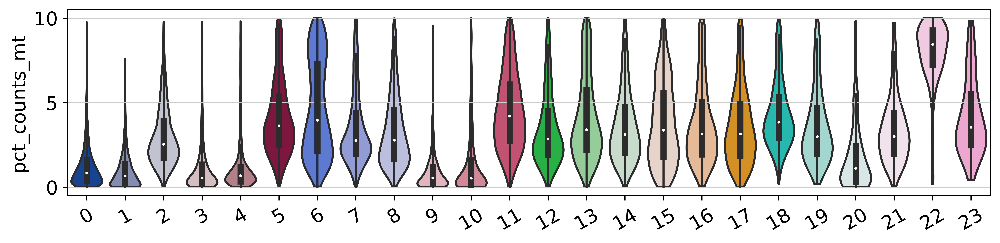

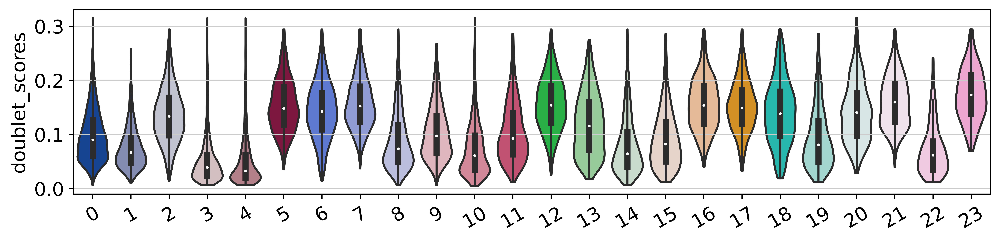

In [35]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

## annotate clusters:

In [36]:

# load cluster anno df 
anno_df = pd.read_csv('data/Mathys_leiden_clusters.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata.obs['annotation'] = temp['annotation'].astype(str).to_list()



In [37]:
# remove unknown & doublet clusters
clusters_to_remove = ['Unknown', 'Doublet']
adata = adata[~adata.obs.annotation.isin(clusters_to_remove)]


In [38]:
# re-make umap 
sc.tl.umap(adata, min_dist=0.35, method='umap')

Trying to set attribute `.uns` of view, copying.


... storing 'cell_type' as categorical
... storing 'annotation' as categorical


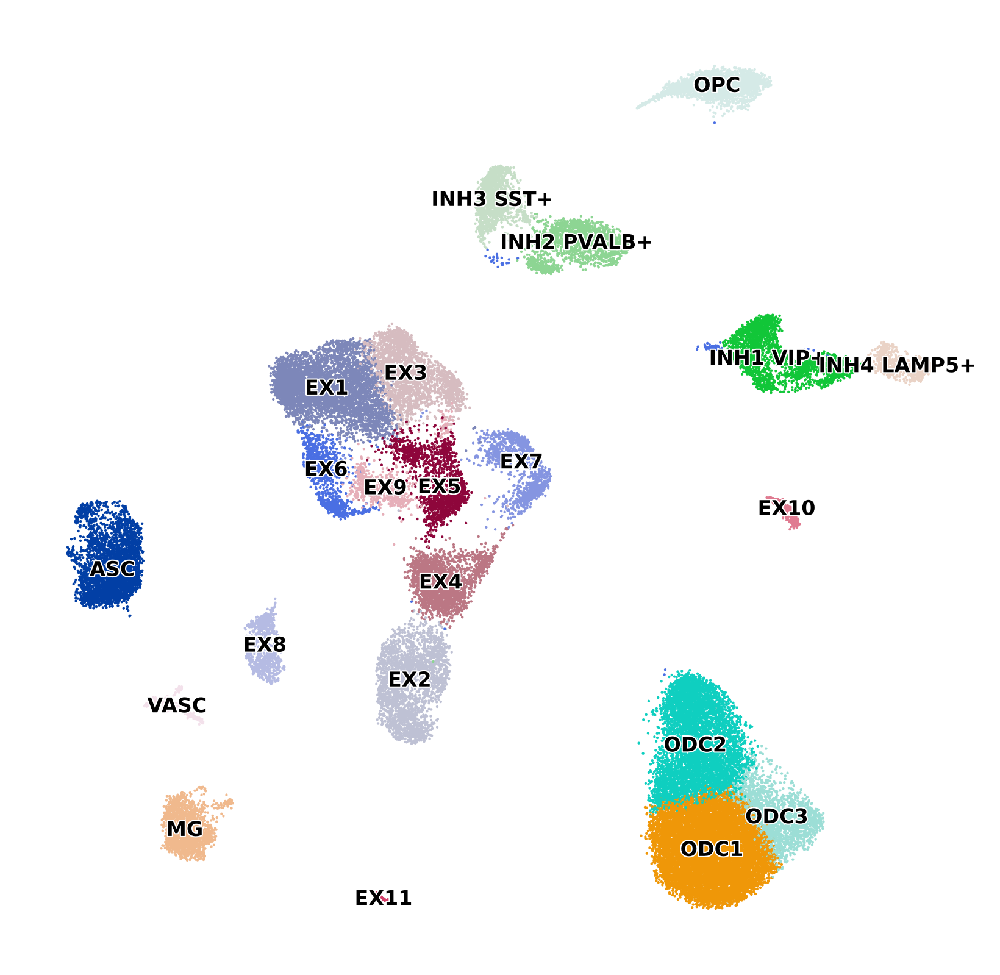

In [39]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation.pdf'
)


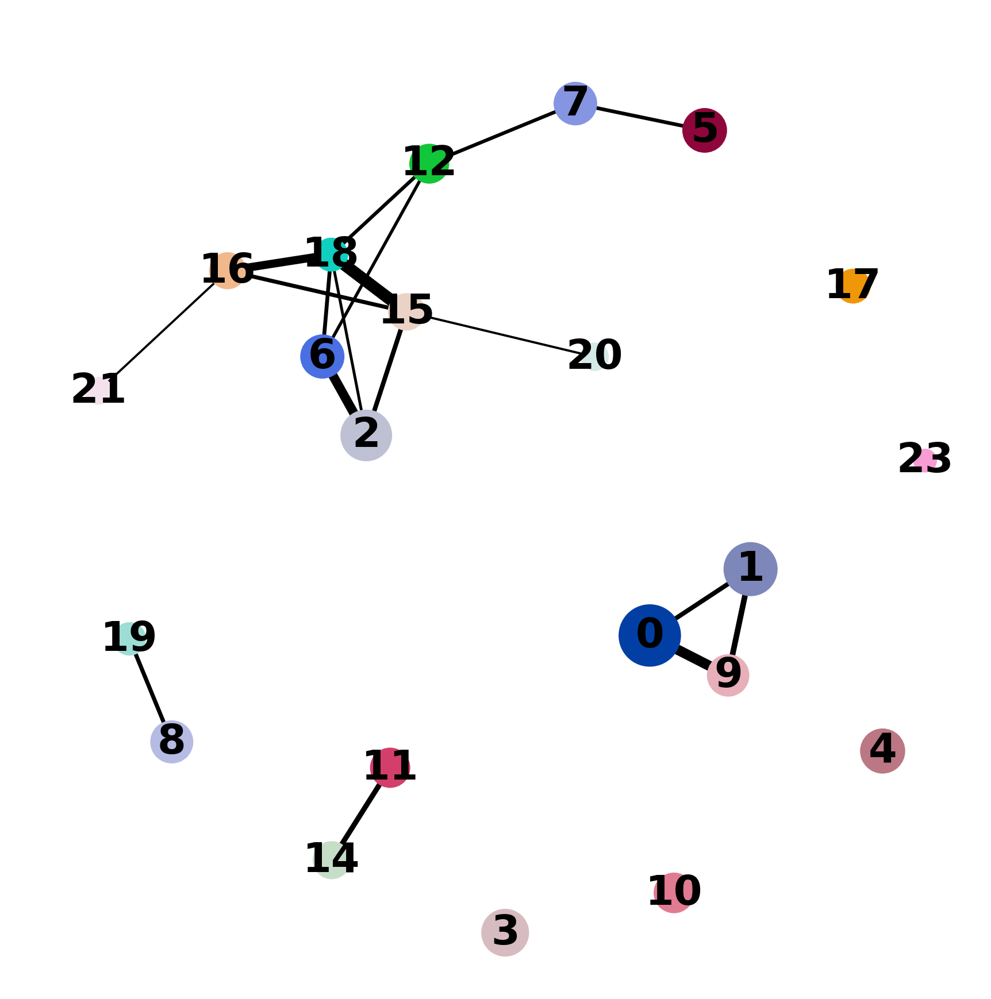

In [40]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.175, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [41]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.4, init_pos='paga')

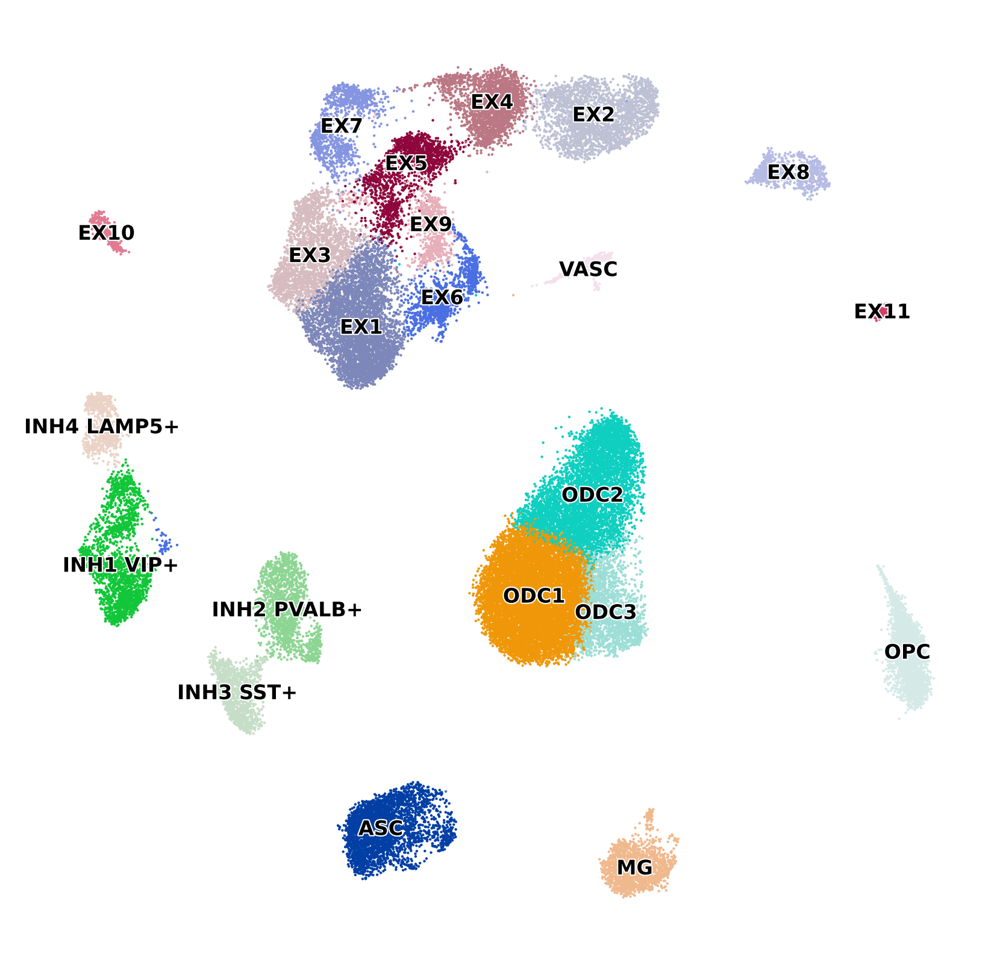

In [42]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation_paga.pdf'
)


In [43]:
adata.obs.cell_type.value_counts()

ODC     17933
EX      17638
INH      5656
ASC      3337
OPC      2596
MG       1653
VASC      342
Name: cell_type, dtype: int64

## Save processed dataset:

In [44]:
# write anndata:
adata.write_h5ad('{}/Mathys_2019_processed.h5ad'.format(data_dir))

In [45]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Mathys_2019_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Mathys_2019_processed_var.csv'.format(data_dir))

In [46]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}/Mathys_2019_counts.mtx'.format(data_dir), X)

In [47]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}/Mathys_2019_processed_harmony.csv'.format(data_dir))
